<a href="https://colab.research.google.com/github/RuchaWete/Transfer-learning/blob/main/Transfer_learning_(vlg).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
  !pip install tensorflow-gpu

In [ ]:
import tensorflow as tf
import os
import pathlib
import io


In [ ]:
!git clone --depth 1 https://github.com/tensorflow/models



In [ ]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .
pip install --upgrade requests dill==0.3.1.1 
pip install --upgrade requests avro-python3==1.8.1  
pip install --upgrade requests folium==0.2.1 

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp37-none-any.whl size=1650082 sha256=9409db37e7a6fbcb4fb5e4ae416834421da922aa69d5bccf8ba310a56da6e541
  Stored in directory: /tmp/pip-ephem-wheel-cache-yc0s1lt1/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
  Created wheel for avro-python3: filename=avro_python3-1.10.2-cp37-none-any.whl size=44011 sha256=fadc12ef58613611051c08d79efaefedafebbc860a5d3deaf3307be989e64e70
  Stored in directory: /root/.cache/pip/wheels/ee/ee/18/c466221ca6900e3efce2f4ea9c329288808679aecdcb2838d3
  Created wheel for dill: filename=dill-0.3.1.1-cp37-none-any.whl size=78532 sha256=3f4477e3b1ef8abcc7afb452b8bb9347c641ac6654f9ea882ec14dba747d4fa9
  Stored in directory: /root/.cache/pip/wheels/59/b1/91/f02e76c732915c4015ab4010f3015469866c1eb9b14058d8e7
  Created wheel for future: filename=future-0.18.2-cp37-none-any.whl size=491058 sha256=6f1a879fc6a16fce37b1917878c323f0e5d3b45ba8af75619c0a

ERROR: multiprocess 0.70.11.1 has requirement dill>=0.3.3, but you'll have dill 0.3.1.1 which is incompatible.
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.25.1 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: apache-beam 2.29.0 has requirement avro-python3!=1.9.2,<1.10.0,>=1.8.1, but you'll have avro-python3 1.10.2 which is incompatible.


In [ ]:
import numpy as np

from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.builders import model_builder

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

import glob
from six import BytesIO
from PIL import Image
import random
import imageio
import scipy.misc


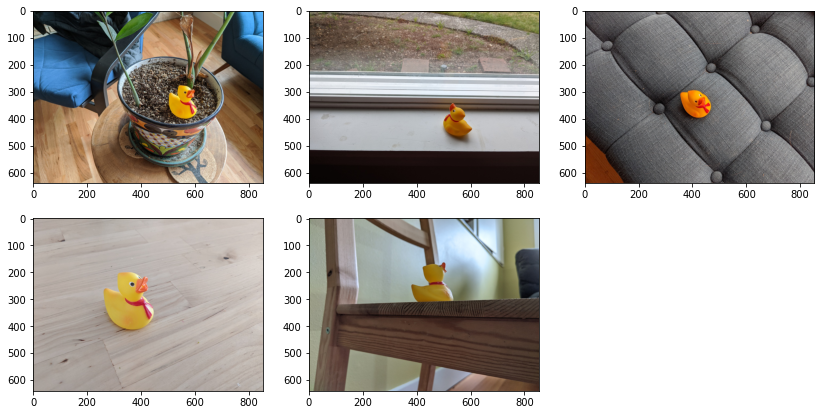

In [ ]:
def plot_detections(image_np,boxes,classes,scores,category_index,figsize=(12, 16),image_name=None):
  annotations_np = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      annotations_np,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, annotations_np)
  else:
    plt.imshow(annotations_np)
def image_into_numpy(path):
  path_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(path_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)
image_dir = 'models/research/object_detection/test_images/ducky/train/'
train_images_np=[]
for i in range(1, 6):
  image_path = os.path.join(image_dir, 'robertducky' + str(i) + '.jpg')
  train_images_np.append(image_into_numpy(image_path))
plt.rcParams['figure.figsize'] = [14, 7]
for idx, train_image_np in enumerate(train_images_np):
  plt.subplot(2, 3, idx+1)
  plt.imshow(train_image_np)
plt.show()

In [ ]:
gt_boxes = []
colab_utils.annotate(train_images_np, box_storage_pointer=gt_boxes)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'--boxes array populated--'

<IPython.core.display.Javascript object>

In [ ]:
gt_boxes


[array([[0.41866666, 0.57796014, 0.637     , 0.71981243]]),
 array([[0.52366666, 0.57327081, 0.74033333, 0.71277843]]),
 array([[0.44533333, 0.40328253, 0.63533333, 0.55803048]]),
 array([[0.30533333, 0.30128957, 0.64866666, 0.53575615]]),
 array([[0.252     , 0.44079719, 0.48366666, 0.62719812]])]

In [ ]:
class_id = 1
num_classes = 1
category_index = {class_id: {'id': class_id, 'name': 'rubber_ducky'}}
label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []
for (train_image_np, gt_box_np) in zip(train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(zero_indexed_groundtruth_classes, num_classes))


In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2021-05-31 12:40:44--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.141.128, 2607:f8b0:4023:c0b::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.141.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M   197MB/s    in 1.2s    

2021-05-31 12:40:45 (197 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [244817203/244817203]



In [ ]:
tf.keras.backend.clear_session()
num_classes = 1
pc = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
model_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'
configs = config_util.get_configs_from_pipeline_file(pc)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(model_config=model_config, is_training=True)
fake_box_predictor = tf.compat.v2.train.Checkpoint(_base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,_box_prediction_head=detection_model._box_predictor._box_prediction_head,)
new_model = tf.compat.v2.train.Checkpoint(_feature_extractor=detection_model._feature_extractor,_box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=new_model)
ckpt.restore(model_path).expect_partial()
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)



In [ ]:
tf.keras.backend.set_learning_phase(True)
batch_size = 4
learning_rate = 0.01
num_batches = 100
trainable_variables = detection_model.trainable_variables
fine_tune_array = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    fine_tune_array.append(var)
def model_training(model, optimizer, finetune_vars):
  @tf.function
  def training_step(img_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):
    shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in img_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      t_loss  = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(t_loss, finetune_vars)
      optimizer.apply_gradients(zip(gradients, finetune_vars))
    return t_loss
  return training_step
optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
training_step = model_training(
    detection_model, optimizer, fine_tune_array)
for idx in range(num_batches):
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]
  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  img_tensors = [train_image_tensors[key] for key in example_keys]
  t_loss = training_step(img_tensors, gt_boxes_list, gt_classes_list)


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


In [ ]:
test_image_dir = 'models/research/object_detection/test_images/ducky/test/'
test_array = []
for i in range(1, 50):
  image_path = os.path.join(test_image_dir, 'out' + str(i) + '.jpg')
  test_array.append(np.expand_dims(
      image_into_numpy(image_path), axis=0))
@tf.function
def detect(input_tensor):
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)
label_id_offset = 1
for i in range(len(test_array)):
  input_tensor = tf.convert_to_tensor(test_array[i], dtype=tf.float32)
  detections = detect(input_tensor)
  plot_detections(
      test_array[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)+ label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name="gif_frame_" + ('%02d' % i) + ".jpg")


Imageio: 'libfreeimage-3.16.0-linux64.so' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/freeimage/libfreeimage-3.16.0-linux64.so (4.6 MB)
Downloading: 8192/4830080 bytes (0.2%)3096576/4830080 bytes (64.1%)4830080/4830080 bytes (100.0%)
  Done
File saved as /root/.imageio/freeimage/libfreeimage-3.16.0-linux64.so.


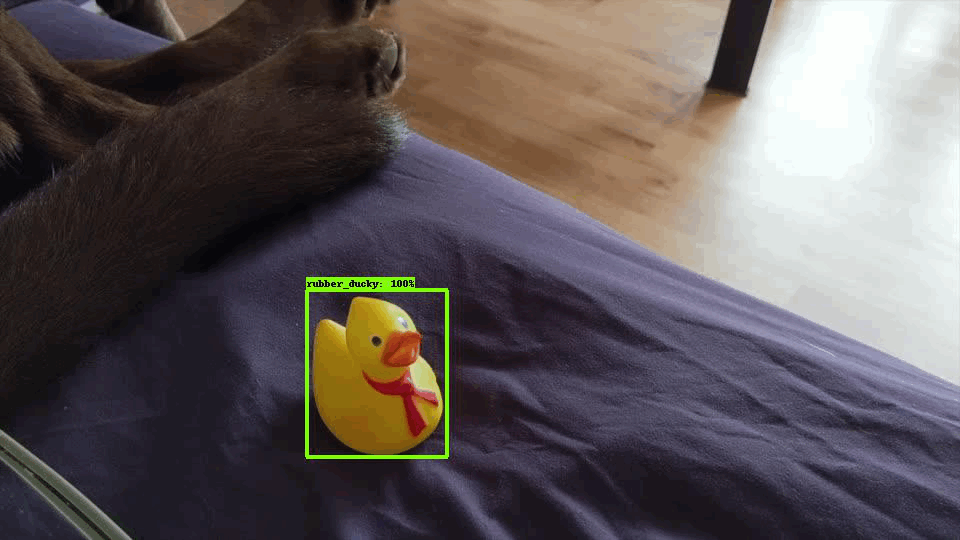

In [ ]:
imageio.plugins.freeimage.download()
GIF_file = 'duckies_test.gif'
files = glob.glob('gif_frame_*.jpg')
files = sorted(files)
last = -1
images = []
for file in files:
  image = imageio.imread(file)
  images.append(image)
imageio.mimsave(GIF_file, images, 'GIF-FI', fps=5)
display(IPyImage(open(GIF_file, 'rb').read()))